In [1]:
import os
import torch
import numpy as np
from math import *
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import torch.nn as nn
import torch.nn.functional as F

from scipy import stats
from skimage import io
import pickle

import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib.colors import Normalize
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cmcrameri.cm as cmc

%matplotlib inline
plt.style.use('stylesheet.mplstyle')

## Load experimental data

In [43]:
folder = '/SOME_PATH/NanobeamNN/data'
data = np.load(os.path.join(folder, 'exp_data.npy'))

# Analysis by conventional correlation fitting method
strain = np.load(os.path.join(folder, 'strain_fit.npy'))
tilt_lr = np.load(os.path.join(folder, 'tilt_lr_fit.npy'))
tilt_ud = np.load(os.path.join(folder, 'tilt_ud_fit.npy'))

strain = np.reshape(strain, (165, 165))
tilt_lr = np.reshape(tilt_lr, (165, 165))
tilt_ud = np.reshape(tilt_ud, (165, 165))

# Center the values around 0 (all are relative quantities)
strain -= np.mean(strain)
tilt_lr -= np.mean(tilt_lr)
tilt_ud -= np.mean(tilt_ud)

In [4]:
class DiffDataset(Dataset):
    """Experimental data. Lattice values calculated separately and not passed in here."""
    
    def __init__(self, data, transform):
        self.data = data
        self.transform = transform
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        image = self.data[idx]
        sample = {'image': image}
        if self.transform:
            sample = self.transform(sample)
        return sample
    
class ToTensor(object):
    """Convert numpy arrays to Tensors"""
    def __call__(self, sample):
        image = sample['image']
        return {'image': torch.unsqueeze(torch.from_numpy(image), 0)}

In [5]:
data_torch = data.astype('float32')

diff_dataset = DiffDataset(data=data_torch, transform=ToTensor())
dataloader = DataLoader(diff_dataset, batch_size=64, shuffle=False)

In [6]:
# Convolutional Neural Network

class NanobeamNN(nn.Module):
    def __init__(self):
        super(NanobeamNN, self).__init__()
        
        self.operation = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=2, kernel_size=3),
            nn.ReLU(),
            nn.Conv2d(2, 4, 3),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),
            
            nn.Conv2d(4, 8, 3),
            nn.ReLU(),
            nn.Conv2d(8, 16, 3),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),
            
            nn.Conv2d(16, 32, 3),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3),
            nn.ReLU(),
            nn.MaxPool2d((2, 2))
        )
        self.fc1 = nn.Linear(1024, 3)
        
    def forward(self, x):
        x = self.operation(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        return x

## Get predictions from each of 10 models 

In [7]:
model_dir = '/SOME_PATH/NanobeamNN/uq_scripts/models'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq0.pth'))

cuda:0


In [8]:
pred_0 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_0 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_0.shape[0]:
            pred_0[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_0 = outputs.detach().cpu().numpy()

pred_0 = np.reshape(pred_0, (pred_0.shape[0]*pred_0.shape[1], pred_0.shape[2]))
pred_0 = np.vstack((pred_0, pred_last_0))
pred_0 = np.reshape(pred_0, (data.shape[0], 3))

pred_strain_0 = np.reshape(pred_0[:, 0]/100, (165, 165))
pred_tilt_lr_0 = np.reshape(pred_0[:, 1]/10, (165, 165))
pred_tilt_ud_0 = np.reshape(pred_0[:, 2]/10, (165, 165))

pred_strain_0 -= np.mean(pred_strain_0)
pred_tilt_lr_0 -= np.mean(pred_tilt_lr_0)
pred_tilt_ud_0 -= np.mean(pred_tilt_ud_0)

torch.Size([25, 3])


[]

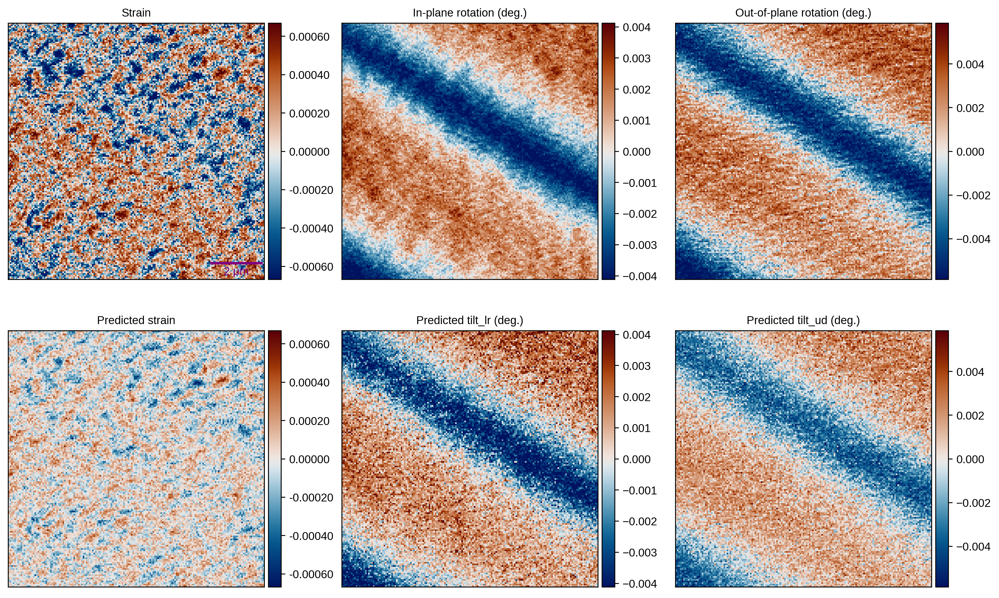

In [9]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_0, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_0, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_0, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [10]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq1.pth'))

cuda:0


In [11]:
pred_1 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_1 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_1.shape[0]:
            pred_1[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_1 = outputs.detach().cpu().numpy()

pred_1 = np.reshape(pred_1, (pred_1.shape[0]*pred_1.shape[1], pred_1.shape[2]))
pred_1 = np.vstack((pred_1, pred_last_1))
pred_1 = np.reshape(pred_1, (data.shape[0], 3))

pred_strain_1 = np.reshape(pred_1[:, 0]/100, (165, 165))
pred_tilt_lr_1 = np.reshape(pred_1[:, 1]/10, (165, 165))
pred_tilt_ud_1 = np.reshape(pred_1[:, 2]/10, (165, 165))

pred_strain_1 -= np.mean(pred_strain_1)
pred_tilt_lr_1 -= np.mean(pred_tilt_lr_1)
pred_tilt_ud_1 -= np.mean(pred_tilt_ud_1)

torch.Size([25, 3])


[]

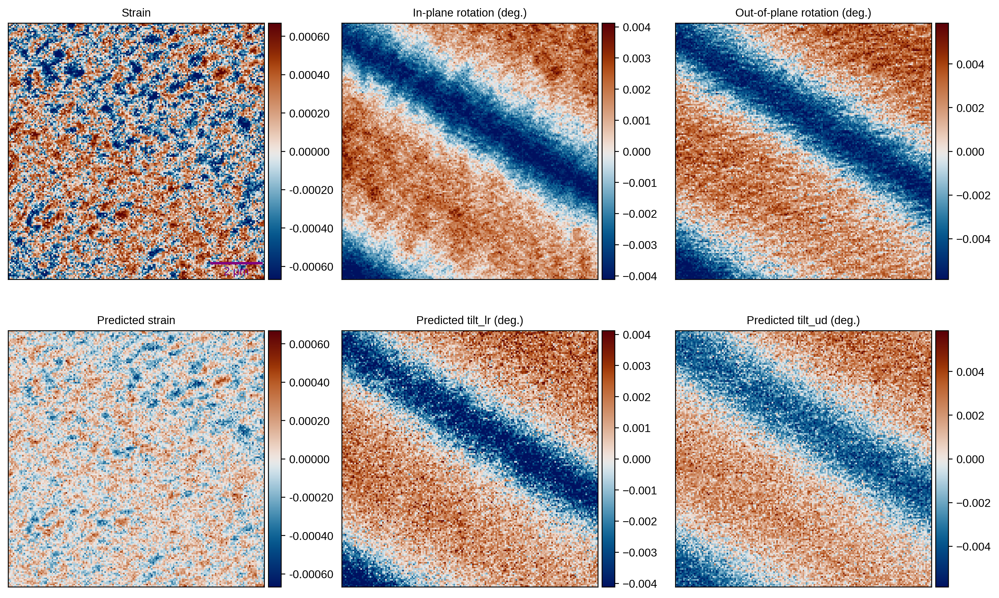

In [12]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_1, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_1, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_1, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [13]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq42.pth'))

cuda:0


In [14]:
pred_42 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_42 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_42.shape[0]:
            pred_42[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_42 = outputs.detach().cpu().numpy()

pred_42 = np.reshape(pred_42, (pred_42.shape[0]*pred_42.shape[1], pred_42.shape[2]))
pred_42 = np.vstack((pred_42, pred_last_42))
pred_42 = np.reshape(pred_42, (data.shape[0], 3))

pred_strain_42 = np.reshape(pred_42[:, 0]/100, (165, 165))
pred_tilt_lr_42 = np.reshape(pred_42[:, 1]/10, (165, 165))
pred_tilt_ud_42 = np.reshape(pred_42[:, 2]/10, (165, 165))

pred_strain_42 -= np.mean(pred_strain_42)
pred_tilt_lr_42 -= np.mean(pred_tilt_lr_42)
pred_tilt_ud_42 -= np.mean(pred_tilt_ud_42)

torch.Size([25, 3])


[]

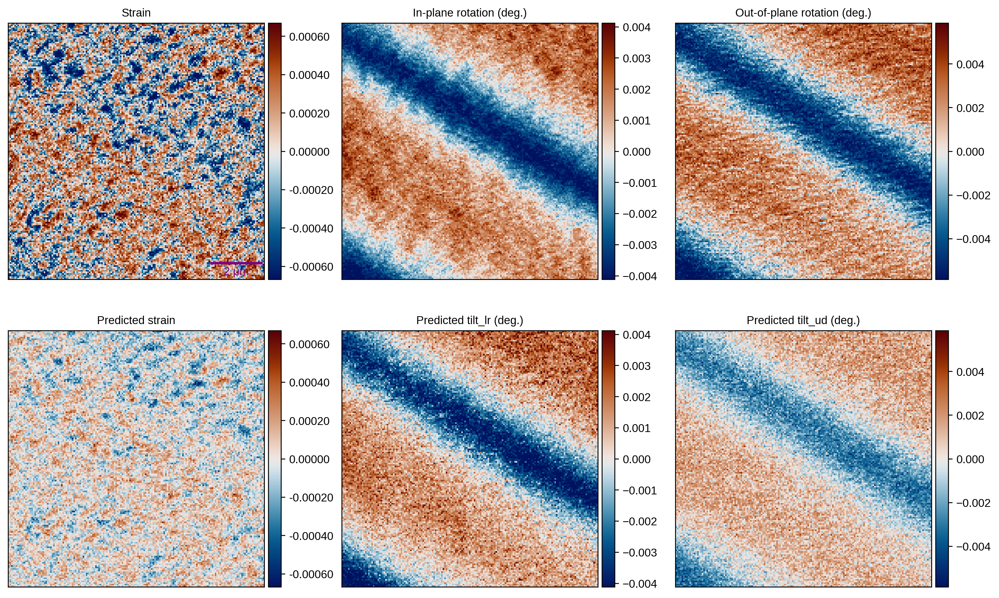

In [15]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_42, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_42, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_42, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [16]:
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq2.pth'))

cuda:1


In [17]:
pred_2 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_2 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_2.shape[0]:
            pred_2[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_2 = outputs.detach().cpu().numpy()

pred_2 = np.reshape(pred_2, (pred_2.shape[0]*pred_2.shape[1], pred_2.shape[2]))
pred_2 = np.vstack((pred_2, pred_last_2))
pred_2 = np.reshape(pred_2, (data.shape[0], 3))

pred_strain_2 = np.reshape(pred_2[:, 0]/100, (165, 165))
pred_tilt_lr_2 = np.reshape(pred_2[:, 1]/10, (165, 165))
pred_tilt_ud_2 = np.reshape(pred_2[:, 2]/10, (165, 165))

pred_strain_2 -= np.mean(pred_strain_2)
pred_tilt_lr_2 -= np.mean(pred_tilt_lr_2)
pred_tilt_ud_2 -= np.mean(pred_tilt_ud_2)

torch.Size([25, 3])


[]

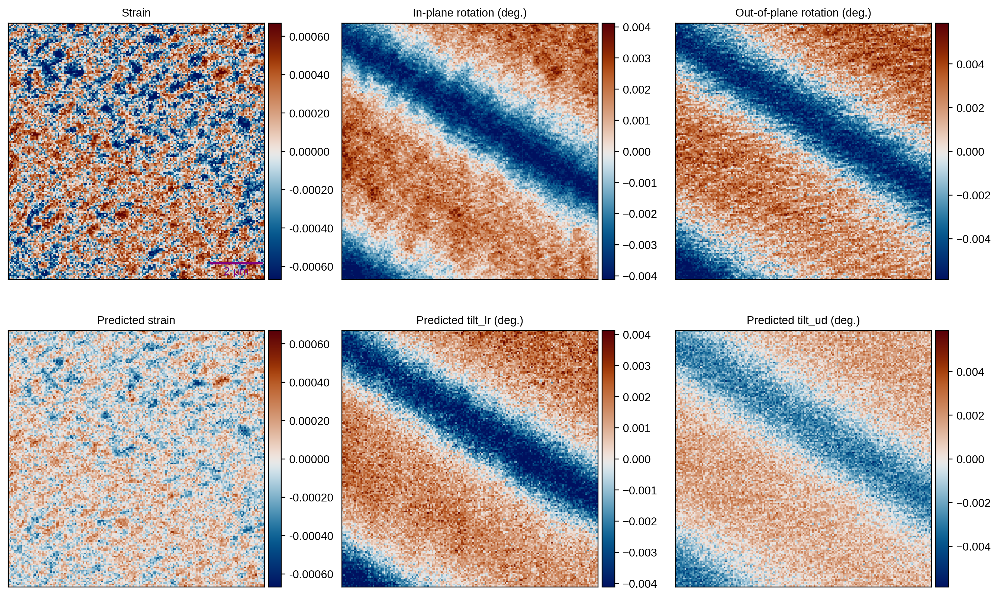

In [18]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_2, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_2, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_2, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [19]:
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq3.pth'))

cuda:1


In [20]:
pred_3 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_3 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_3.shape[0]:
            pred_3[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_3 = outputs.detach().cpu().numpy()

pred_3 = np.reshape(pred_3, (pred_3.shape[0]*pred_3.shape[1], pred_3.shape[2]))
pred_3 = np.vstack((pred_3, pred_last_3))
pred_3 = np.reshape(pred_3, (data.shape[0], 3))

pred_strain_3 = np.reshape(pred_3[:, 0]/100, (165, 165))
pred_tilt_lr_3 = np.reshape(pred_3[:, 1]/10, (165, 165))
pred_tilt_ud_3 = np.reshape(pred_3[:, 2]/10, (165, 165))

pred_strain_3 -= np.mean(pred_strain_3)
pred_tilt_lr_3 -= np.mean(pred_tilt_lr_3)
pred_tilt_ud_3 -= np.mean(pred_tilt_ud_3)

torch.Size([25, 3])


[]

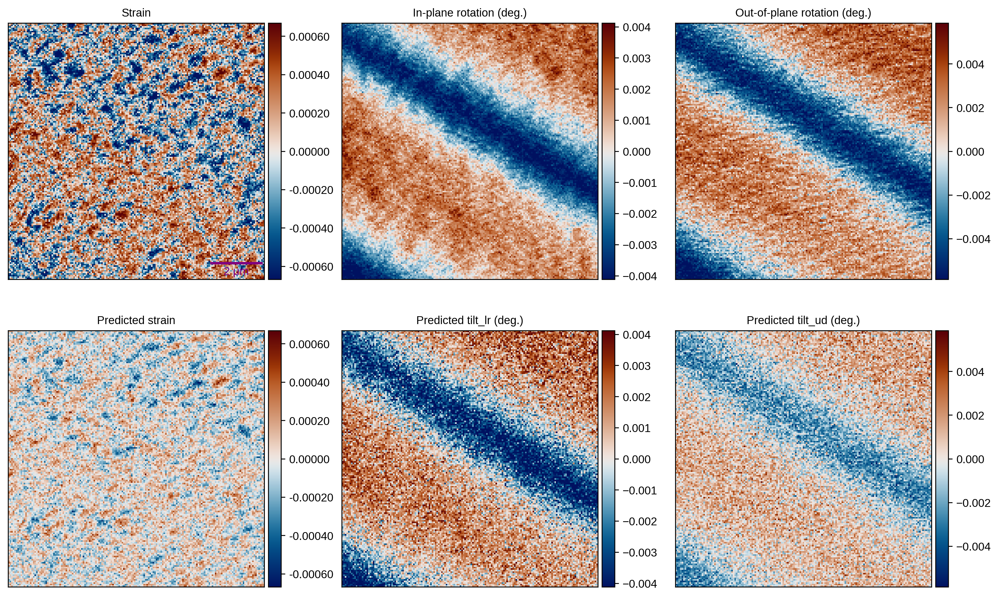

In [21]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_3, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_3, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_3, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [22]:
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq4.pth'))

cuda:1


In [23]:
pred_4 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_4 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_4.shape[0]:
            pred_4[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_4 = outputs.detach().cpu().numpy()

pred_4 = np.reshape(pred_4, (pred_4.shape[0]*pred_4.shape[1], pred_4.shape[2]))
pred_4 = np.vstack((pred_4, pred_last_4))
pred_4 = np.reshape(pred_4, (data.shape[0], 3))

pred_strain_4 = np.reshape(pred_4[:, 0]/100, (165, 165))
pred_tilt_lr_4 = np.reshape(pred_4[:, 1]/10, (165, 165))
pred_tilt_ud_4 = np.reshape(pred_4[:, 2]/10, (165, 165))

pred_strain_4 -= np.mean(pred_strain_4)
pred_tilt_lr_4 -= np.mean(pred_tilt_lr_4)
pred_tilt_ud_4 -= np.mean(pred_tilt_ud_4)

torch.Size([25, 3])


[]

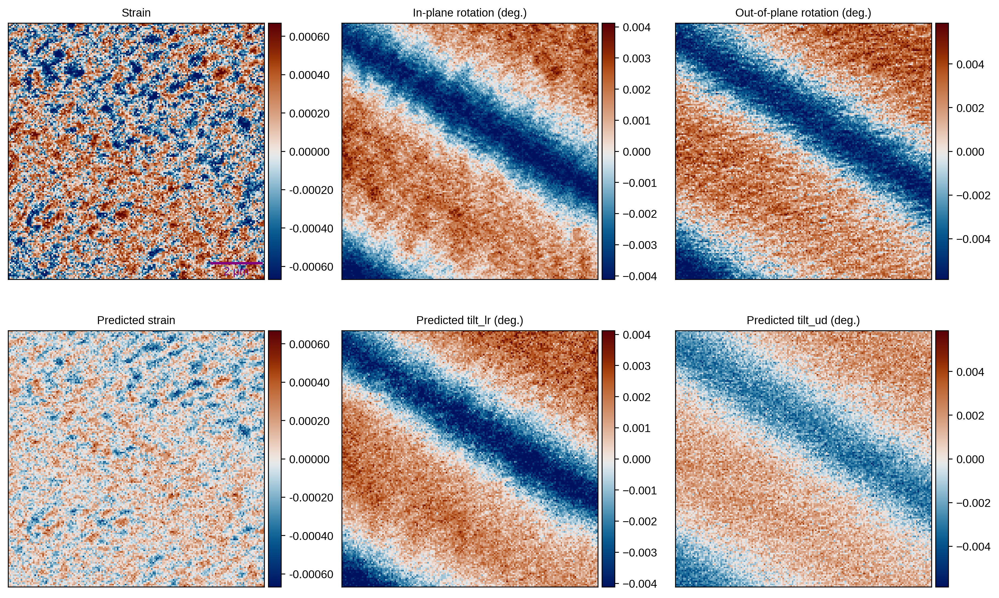

In [24]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_4, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_4, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_4, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [25]:
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq5.pth'))

cuda:2


In [26]:
pred_5 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_5 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_5.shape[0]:
            pred_5[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_5 = outputs.detach().cpu().numpy()

pred_5 = np.reshape(pred_5, (pred_5.shape[0]*pred_5.shape[1], pred_5.shape[2]))
pred_5 = np.vstack((pred_5, pred_last_5))
pred_5 = np.reshape(pred_5, (data.shape[0], 3))

pred_strain_5 = np.reshape(pred_5[:, 0]/100, (165, 165))
pred_tilt_lr_5 = np.reshape(pred_5[:, 1]/10, (165, 165))
pred_tilt_ud_5 = np.reshape(pred_5[:, 2]/10, (165, 165))

pred_strain_5 -= np.mean(pred_strain_5)
pred_tilt_lr_5 -= np.mean(pred_tilt_lr_5)
pred_tilt_ud_5 -= np.mean(pred_tilt_ud_5)

torch.Size([25, 3])


[]

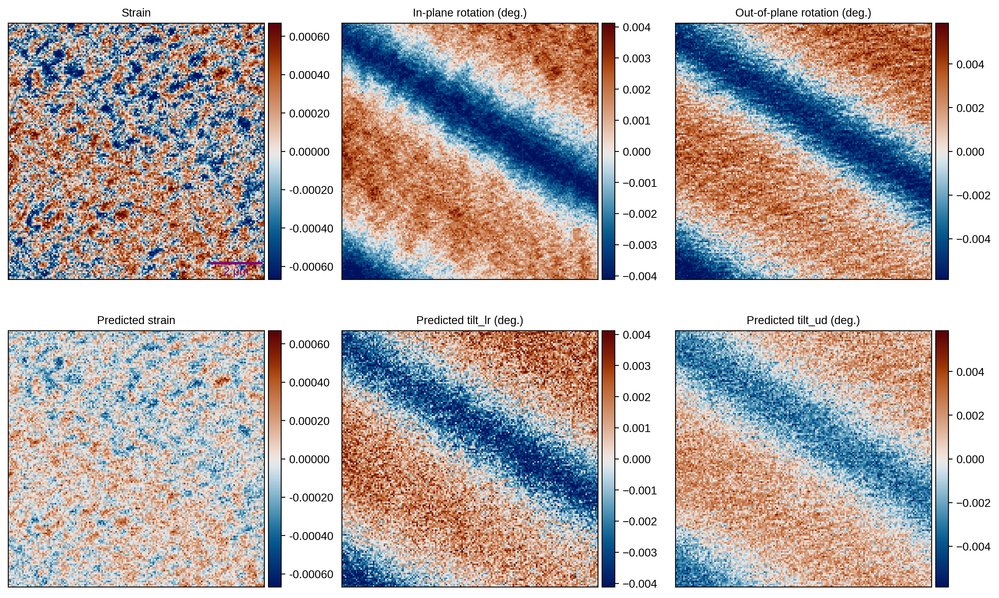

In [27]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_5, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_5, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_5, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [28]:
device = torch.device('cuda:2' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq6.pth'))

cuda:2


In [29]:
pred_6 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_6 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_6.shape[0]:
            pred_6[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_6 = outputs.detach().cpu().numpy()

pred_6 = np.reshape(pred_6, (pred_6.shape[0]*pred_6.shape[1], pred_6.shape[2]))
pred_6 = np.vstack((pred_6, pred_last_6))
pred_6 = np.reshape(pred_6, (data.shape[0], 3))

pred_strain_6 = np.reshape(pred_6[:, 0]/100, (165, 165))
pred_tilt_lr_6 = np.reshape(pred_6[:, 1]/10, (165, 165))
pred_tilt_ud_6 = np.reshape(pred_6[:, 2]/10, (165, 165))

pred_strain_6 -= np.mean(pred_strain_6)
pred_tilt_lr_6 -= np.mean(pred_tilt_lr_6)
pred_tilt_ud_6 -= np.mean(pred_tilt_ud_6)

torch.Size([25, 3])


[]

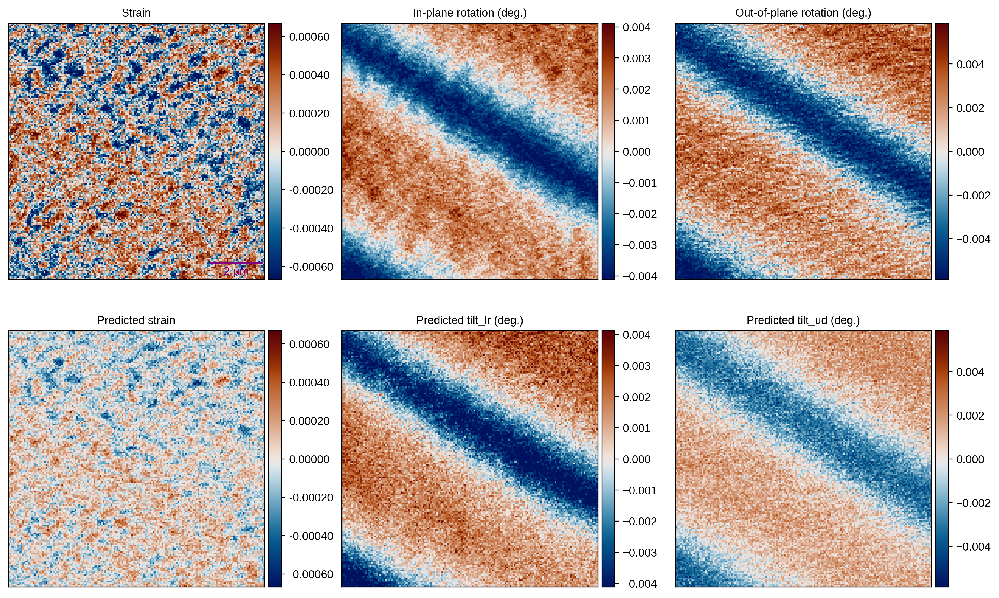

In [30]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_6, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_6, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_6, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [31]:
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq7.pth'))

cuda:3


In [32]:
pred_7 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_7 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_7.shape[0]:
            pred_7[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_7 = outputs.detach().cpu().numpy()

pred_7 = np.reshape(pred_7, (pred_7.shape[0]*pred_7.shape[1], pred_7.shape[2]))
pred_7 = np.vstack((pred_7, pred_last_7))
pred_7 = np.reshape(pred_7, (data.shape[0], 3))

pred_strain_7 = np.reshape(pred_7[:, 0]/100, (165, 165))
pred_tilt_lr_7 = np.reshape(pred_7[:, 1]/10, (165, 165))
pred_tilt_ud_7 = np.reshape(pred_7[:, 2]/10, (165, 165))

pred_strain_7 -= np.mean(pred_strain_7)
pred_tilt_lr_7 -= np.mean(pred_tilt_lr_7)
pred_tilt_ud_7 -= np.mean(pred_tilt_ud_7)

torch.Size([25, 3])


[]

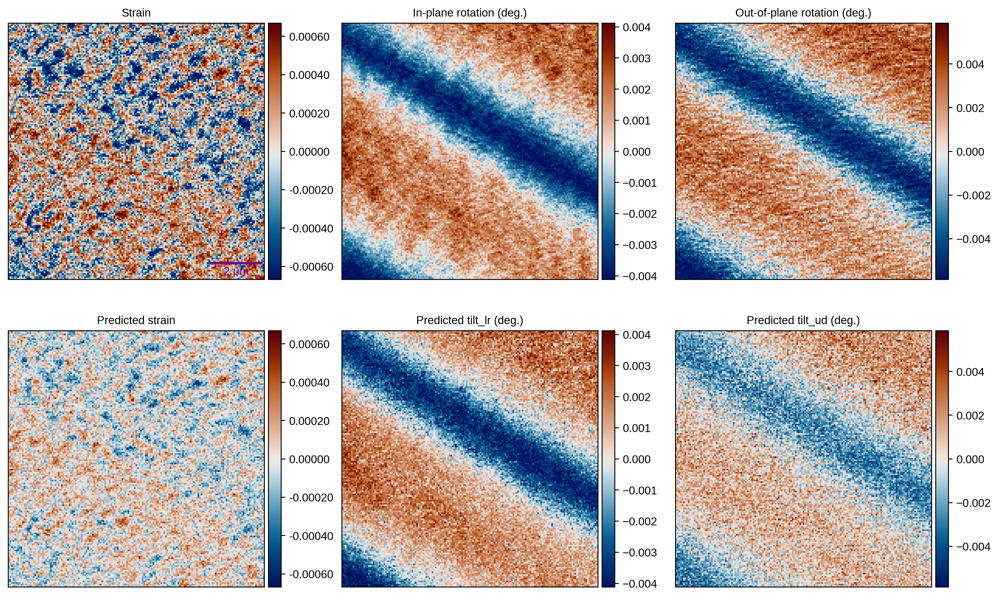

In [33]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_7, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_7, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_7, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

In [34]:
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
cnn = torch.load(os.path.join(model_dir, 'best_model_uq8.pth'))

cuda:3


In [35]:
pred_8 = np.zeros((len(dataloader)-1, 64, 3))
pred_last_8 = np.zeros((25, 3)) # Last batch in training set is different size

with torch.no_grad():
    for i, sample in enumerate(dataloader):
        images = sample['image'].to(device)
        outputs = cnn(images)
        if i < pred_8.shape[0]:
            pred_8[i] = outputs.detach().cpu().numpy()
        else:
            print(outputs.size())
            pred_last_8 = outputs.detach().cpu().numpy()

pred_8 = np.reshape(pred_8, (pred_8.shape[0]*pred_8.shape[1], pred_8.shape[2]))
pred_8 = np.vstack((pred_8, pred_last_8))
pred_8 = np.reshape(pred_8, (data.shape[0], 3))

pred_strain_8 = np.reshape(pred_8[:, 0]/100, (165, 165))
pred_tilt_lr_8 = np.reshape(pred_8[:, 1]/10, (165, 165))
pred_tilt_ud_8 = np.reshape(pred_8[:, 2]/10, (165, 165))

pred_strain_8 -= np.mean(pred_strain_8)
pred_tilt_lr_8 -= np.mean(pred_tilt_lr_8)
pred_tilt_ud_8 -= np.mean(pred_tilt_ud_8)

torch.Size([25, 3])


[]

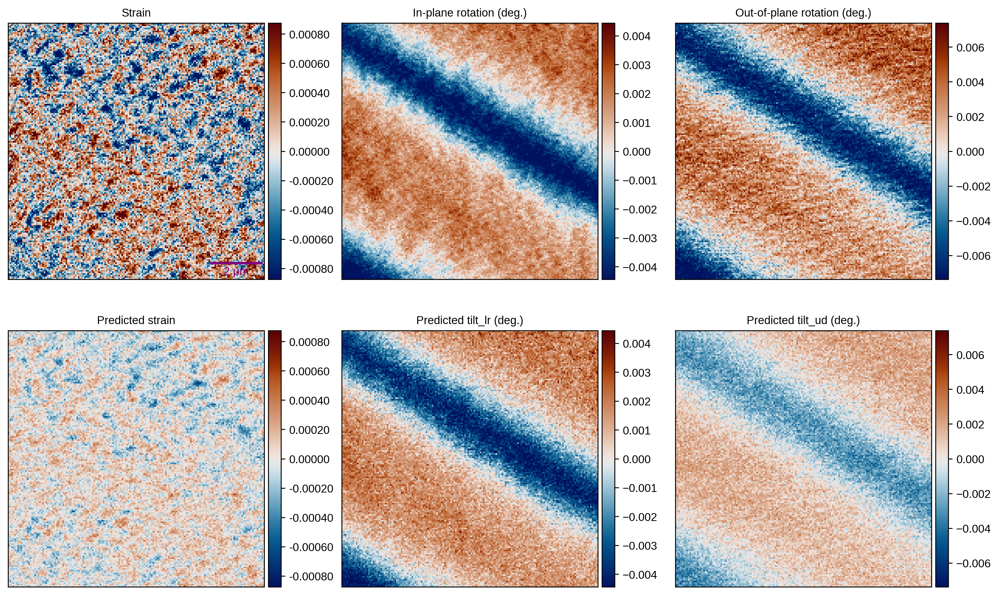

In [44]:
f, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=3)

vmin0 = np.mean(strain)-(2*np.std(strain))
vmax0 = np.mean(strain)+(2*np.std(strain))
vmin1 = np.mean(tilt_lr)-(2*np.std(tilt_lr))
vmax1 = np.mean(tilt_lr)+(2*np.std(tilt_lr))
vmin2 = np.mean(tilt_ud)-(2*np.std(tilt_ud))
vmax2 = np.mean(tilt_ud)+(2*np.std(tilt_ud))

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='vertical', format='%.5f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='purple', 
                           frameon=False, size_vertical=1)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='vertical')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='vertical')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(pred_strain_8, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='vertical', format='%.5f')
ax[1, 0].set_title('Predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(pred_tilt_lr_8, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='vertical')
ax[1, 1].set_title('Predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(pred_tilt_ud_8, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('right', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='vertical')
ax[1, 2].set_title('Predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

## Compilation of model predictions

In [37]:
all_pred_strain = np.concatenate((pred_strain_0[np.newaxis, :, :], pred_strain_1[np.newaxis, :, :],
                                  pred_strain_42[np.newaxis, :, :], pred_strain_2[np.newaxis, :, :],
                                  pred_strain_3[np.newaxis, :, :], pred_strain_4[np.newaxis, :, :],
                                  pred_strain_5[np.newaxis, :, :], pred_strain_6[np.newaxis, :, :],
                                  pred_strain_7[np.newaxis, :, :], pred_strain_8[np.newaxis, :, :]))
all_pred_tilt_lr = np.concatenate((pred_tilt_lr_0[np.newaxis, :, :], pred_tilt_lr_1[np.newaxis, :, :], 
                                   pred_tilt_lr_42[np.newaxis, :, :], pred_tilt_lr_2[np.newaxis, :, :], 
                                   pred_tilt_lr_3[np.newaxis, :, :], pred_tilt_lr_4[np.newaxis, :, :], 
                                   pred_tilt_lr_5[np.newaxis, :, :], pred_tilt_lr_6[np.newaxis, :, :], 
                                   pred_tilt_lr_7[np.newaxis, :, :], pred_tilt_lr_8[np.newaxis, :, :]))
all_pred_tilt_ud = np.concatenate((pred_tilt_ud_0[np.newaxis, :, :], pred_tilt_ud_1[np.newaxis, :, :], 
                                   pred_tilt_ud_42[np.newaxis, :, :], pred_tilt_ud_2[np.newaxis, :, :], 
                                   pred_tilt_ud_3[np.newaxis, :, :], pred_tilt_ud_4[np.newaxis, :, :], 
                                   pred_tilt_ud_5[np.newaxis, :, :], pred_tilt_ud_6[np.newaxis, :, :], 
                                   pred_tilt_ud_7[np.newaxis, :, :], pred_tilt_ud_8[np.newaxis, :, :]))

avg_pred_strain = np.mean(all_pred_strain, axis=0)
std_pred_strain = np.std(all_pred_strain, axis=0)
avg_pred_tilt_lr = np.mean(all_pred_tilt_lr, axis=0)
std_pred_tilt_lr = np.std(all_pred_tilt_lr, axis=0)
avg_pred_tilt_ud = np.mean(all_pred_tilt_ud, axis=0)
std_pred_tilt_ud = np.std(all_pred_tilt_ud, axis=0)

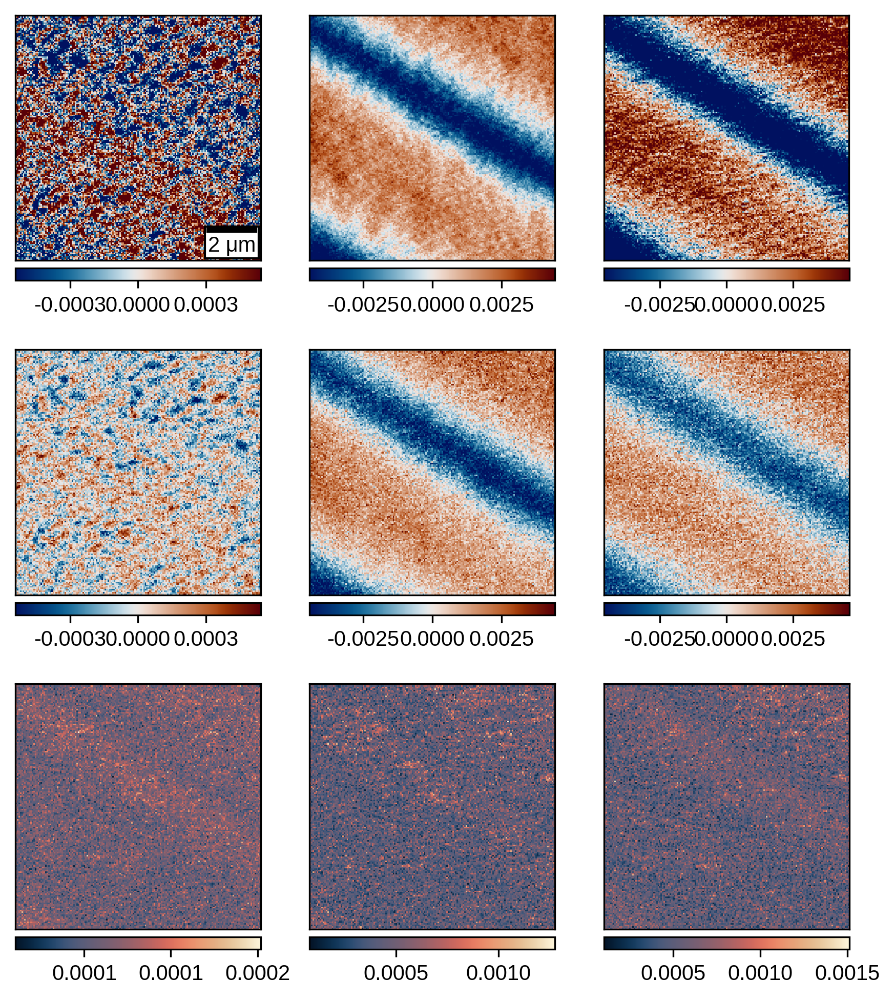

In [50]:
# Refer to Fig. 4 and S5b

vmin0 = np.mean(avg_pred_strain) - (3 * np.std(avg_pred_strain))
vmax0 = np.mean(avg_pred_strain) + (3 * np.std(avg_pred_strain))
vmin2 = np.mean(avg_pred_tilt_ud) - (2.5 * np.std(avg_pred_tilt_ud))
vmax2 = np.mean(avg_pred_tilt_ud) + (2.5 * np.std(avg_pred_tilt_ud))

f, ax = plt.subplots(figsize=(7, 8), nrows=3, ncols=3)

im0 = ax[0, 0].imshow(strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 0])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(im0, cax=cax, orientation='horizontal', format='%.4f')
scalebar = AnchoredSizeBar(ax[0, 0].transData, 33, u'2 μm', 'lower right', pad=0.1, color='black', 
                           frameon=True, size_vertical=2)

ax[0, 0].add_artist(scalebar)
ax[0, 0].set_title('Strain')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

im1 = ax[0, 1].imshow(tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 1])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(im1, cax=cax, orientation='horizontal', format='%.4f')
ax[0, 1].set_title('In-plane rotation (deg.)')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

im2 = ax[0, 2].imshow(tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, cmap=cmc.vik)
divider = make_axes_locatable(ax[0, 2])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(im2, cax=cax, orientation='horizontal', format='%.4f')
ax[0, 2].set_title('Out-of-plane rotation (deg.)')
ax[0, 2].set_xticks([])
ax[0, 2].set_yticks([])

pred_im0 = ax[1, 0].imshow(avg_pred_strain, interpolation='none', origin='lower', vmin=vmin0, vmax=vmax0, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 0])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(pred_im0, cax=cax, orientation='horizontal', format='%.4f')
ax[1, 0].set_title('Average predicted strain')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

pred_im1 = ax[1, 1].imshow(avg_pred_tilt_lr, interpolation='none', origin='lower', vmin=vmin1, vmax=vmax1, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 1])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(pred_im1, cax=cax, orientation='horizontal', format='%.4f')
ax[1, 1].set_title('Average predicted tilt_lr (deg.)')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

pred_im2 = ax[1, 2].imshow(avg_pred_tilt_ud, interpolation='none', origin='lower', vmin=vmin2, vmax=vmax2, 
                           cmap=cmc.vik)
divider = make_axes_locatable(ax[1, 2])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(pred_im2, cax=cax, orientation='horizontal', format='%.4f')
ax[1, 2].set_title('Average predicted tilt_ud (deg.)')
ax[1, 2].set_xticks([])
ax[1, 2].set_yticks([])

std_im0 = ax[2, 0].imshow(std_pred_strain, interpolation='none', origin='lower', cmap=cmc.lipari)
divider = make_axes_locatable(ax[2, 0])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(std_im0, cax=cax, orientation='horizontal', format='%.4f')
ax[2, 0].set_title('Strain model error')
ax[2, 0].set_xticks([])
ax[2, 0].set_yticks([])

std_im1 = ax[2, 1].imshow(std_pred_tilt_lr, interpolation='none', origin='lower', cmap=cmc.lipari)
divider = make_axes_locatable(ax[2, 1])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(std_im1, cax=cax, orientation='horizontal', format='%.4f')
ax[2, 1].set_title('Tilt_lr model error (deg.)')
ax[2, 1].set_xticks([])
ax[2, 1].set_yticks([])

std_im2 = ax[2, 2].imshow(std_pred_tilt_ud, interpolation='none', origin='lower', cmap=cmc.lipari)
divider = make_axes_locatable(ax[2, 2])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
f.colorbar(std_im2, cax=cax, orientation='horizontal', format='%.4f')
ax[2, 2].set_title('Tilt_ud model error (deg.)')
ax[2, 2].set_xticks([])
ax[2, 2].set_yticks([])

In [46]:
stats.pearsonr(strain.flatten(), avg_pred_strain.flatten())[0]

0.8919566833614926

## Consolidate loss for all the models

In [51]:
metrics_dir = '/SOME_PATH/Nanobeam_NN/uq_scripts/metrics'

# Read dictionary pkl file containing loss, validation loss
with open(os.path.join(metrics_dir, 'metrics0.pkl'), 'rb') as fp:
    metrics_0 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics1.pkl'), 'rb') as fp:
    metrics_1 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics42.pkl'), 'rb') as fp:
    metrics_42 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics2.pkl'), 'rb') as fp:
    metrics_2 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics3.pkl'), 'rb') as fp:
    metrics_3 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics4.pkl'), 'rb') as fp:
    metrics_4 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics5.pkl'), 'rb') as fp:
    metrics_5 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics6.pkl'), 'rb') as fp:
    metrics_6 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics7.pkl'), 'rb') as fp:
    metrics_7 = pickle.load(fp)
with open(os.path.join(metrics_dir, 'metrics8.pkl'), 'rb') as fp:
    metrics_8 = pickle.load(fp)

In [52]:
tot_loss = np.concatenate((np.asarray(metrics_0['losses'])[np.newaxis, :], 
                           np.asarray(metrics_1['losses'])[np.newaxis, :], 
                           np.asarray(metrics_42['losses'])[np.newaxis, :], 
                           np.asarray(metrics_2['losses'])[np.newaxis, :], 
                           np.asarray(metrics_3['losses'])[np.newaxis, :], 
                           np.asarray(metrics_4['losses'])[np.newaxis, :], 
                           np.asarray(metrics_5['losses'])[np.newaxis, :], 
                           np.asarray(metrics_6['losses'])[np.newaxis, :], 
                           np.asarray(metrics_7['losses'])[np.newaxis, :], 
                           np.asarray(metrics_8['losses'])[np.newaxis, :]))
tot_val_loss = np.concatenate((np.asarray(metrics_0['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_1['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_42['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_2['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_3['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_4['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_5['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_6['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_7['val_losses'])[np.newaxis, :], 
                               np.asarray(metrics_8['val_losses'])[np.newaxis, :]))

avg_loss = np.mean(tot_loss, axis=0)
loss_err = np.std(tot_loss, axis=0)
avg_val_loss = np.mean(tot_val_loss, axis=0)
val_loss_err = np.std(tot_val_loss, axis=0)

In [53]:
# Discrete colormap
oslo = cm.get_cmap(cmc.oslo, 6)
oslo4 = oslo(np.linspace(0, 1, 6))

/tmp/ipykernel_1087694/3523816358.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  oslo = cm.get_cmap(cmc.oslo, 6)


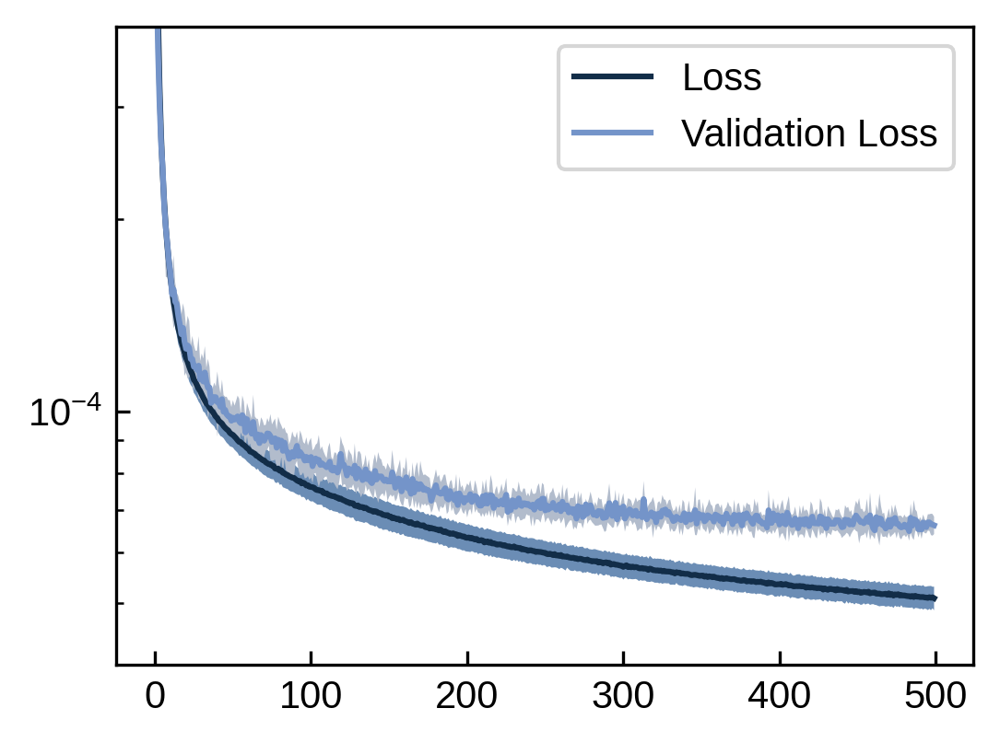

In [57]:
# Refer to Fig. S5a
x = np.linspace(0, 499, 500)

f, ax = plt.subplots(figsize=(4, 3))

ax.plot(avg_loss, color=oslo4[1], label='Loss')
ax.fill_between(x, avg_loss-loss_err, avg_loss+loss_err, alpha=0.7, facecolor=oslo4[2], edgecolor=None)
ax.plot(avg_val_loss, color=oslo4[3], label='Validation Loss')
ax.fill_between(x, avg_val_loss-val_loss_err, avg_val_loss+val_loss_err, alpha=1, 
                facecolor=oslo4[4], edgecolor=None)
ax.set_ylim(ymin=4e-5, ymax=4e-4)
ax.set_yscale('log')
ax.set_xlabel('Epochs')
ax.set_ylabel('Log. Loss')
ax.tick_params(which='both', direction='in')
ax.legend()

## Comparison of input diffraction vs. simulation from predicted values

In [49]:
oversampling1 = 1

energy = 11.3
wavelength = 12.398/energy
K=2*pi/wavelength
c = 4.013
l = 2
alf0 = asin(wavelength*l/2/c)
alf = alf0 
twotheta = (2 * alf0) 
X0 =  256 
Xcen = 256 

distance = 0.85
pixelsize = 55e-6/oversampling1*2 # The *2 is for binning

gam0 = twotheta-alf

focal_length = 21.874e-3
outer_angle = 149e-6/2/focal_length # diameter of FZP is 150 um
inner_angle = 77e-6/2/focal_length # diameter of CS is 75 um 

precision = 5e-4 # for fast numerical integration

det_x = np.arange(64*oversampling1).astype(np.float64)
det_y = np.arange(64*oversampling1).astype(np.float64)
det_x = det_x - det_x.mean() + X0 - (X0-Xcen)*oversampling1
det_y -= det_y.mean()

det_xx, det_yy = np.meshgrid(det_x,det_y)

gam = np.arcsin((det_xx-X0)*pixelsize/distance)+gam0

#detector
det_Qx = K*(np.cos(alf)-np.cos(gam))
det_Qz = K*(np.sin(gam)+np.sin(alf))
det_Qy = det_yy*pixelsize/distance*K

oversampling2 = 2

O_x = np.arange(64*oversampling2).astype(np.float64)
O_y = np.arange(64*oversampling2).astype(np.float64)
O_x -= O_x.mean()
O_y -= O_y.mean()

O_xx, O_yy = np.meshgrid(O_x,O_y)
O_xx = O_xx[:,:,np.newaxis,np.newaxis]
O_yy = O_yy[:,:,np.newaxis,np.newaxis]

# origin of the reciprocal space
O_Qx = -O_xx*pixelsize*oversampling1/oversampling2/distance*K*sin(alf)
O_Qz = O_xx*pixelsize*oversampling1/oversampling2/distance*K*cos(alf) # the sign of Qx and Qz are opposite in this convention
O_Qy = O_yy*pixelsize*oversampling1/oversampling2/distance*K
O_angle = np.sqrt(O_yy**2+O_xx**2)*pixelsize*oversampling1/oversampling2/distance
O_donut = (O_angle < outer_angle) * (O_angle > inner_angle)

In [50]:
def Thickness_Fringe(thickness=117, strain=0, tilt_lr=0, tilt_ud=0, precision=5e-4):

    return ((thickness*np.sinc(thickness*(det_Qz-2*pi/c*l/(1+strain)-O_Qz)/pi/2)**2 *\
            (np.abs(det_Qx+2*pi/c*l/(1+strain)*radians(tilt_lr)-O_Qx)<precision) *\
            (np.abs(det_Qy+2*pi/c*l/(1+strain)*radians(tilt_ud)-O_Qy)<precision))*O_donut)\
            .sum(axis=(0,1)).reshape(64,oversampling1,64,oversampling1).mean(axis=(1,3))

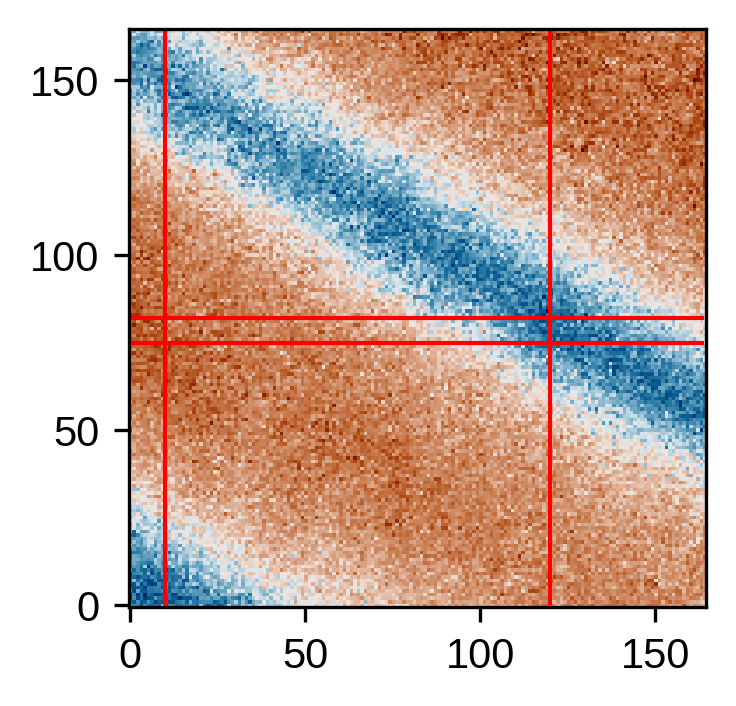

In [51]:
f, ax = plt.subplots(figsize=(2.5, 2.5))

ax.imshow(avg_pred_tilt_lr, interpolation='none', origin='lower', cmap=cmc.vik)
ax.hlines([75, 82], 0, 164, color='red', linewidth=1)
ax.vlines([10, 120], 0, 164, color='red', linewidth=1)

In [52]:
(75*165)+10, (82*165)+120

(12385, 13650)

In [64]:
idx_sim = np.array([12385, 13650])
plot_images = np.zeros((2, 64, 64))
plot_labels = np.zeros((2, 3))
for i in range(len(idx_sim)):
    for j, data in enumerate(dataloader):
        if idx_sim[i] // 64 == j:
            print(j, idx_sim[i])
            images = data['image']
            print((j * 64) + (idx_sim[i] % 64))
            plot_images[i] = images[idx_sim[i] % 64].squeeze().detach().numpy()

193 12385
12385
213 13650
13650


In [65]:
avg_pred_strain_copy = np.copy(avg_pred_strain).reshape(27225, )
avg_pred_tilt_lr_copy = np.copy(avg_pred_tilt_lr).reshape(27225, )
avg_pred_tilt_ud_copy = np.copy(avg_pred_tilt_ud).reshape(27225, )

sim_pred = np.zeros((2, 64, 64))
for i in range(sim_pred.shape[0]):
    sim_pred[i] = Thickness_Fringe(117, strain=avg_pred_strain_copy[idx_sim[i]], 
                                   tilt_lr=avg_pred_tilt_lr_copy[idx_sim[i]], 
                                   tilt_ud=avg_pred_tilt_ud_copy[idx_sim[i]])
sim_pred[0] = (sim_pred[0] / np.max(sim_pred[0])) * 7
sim_pred[1] = (sim_pred[1] / np.max(sim_pred[1])) * 7

for i in range(sim_pred.shape[0]):
    sim_pred[i] = np.random.poisson(sim_pred[i])

sim_pred = np.rint(sim_pred).astype('float32')
sim_pred[sim_pred < 2] = 0

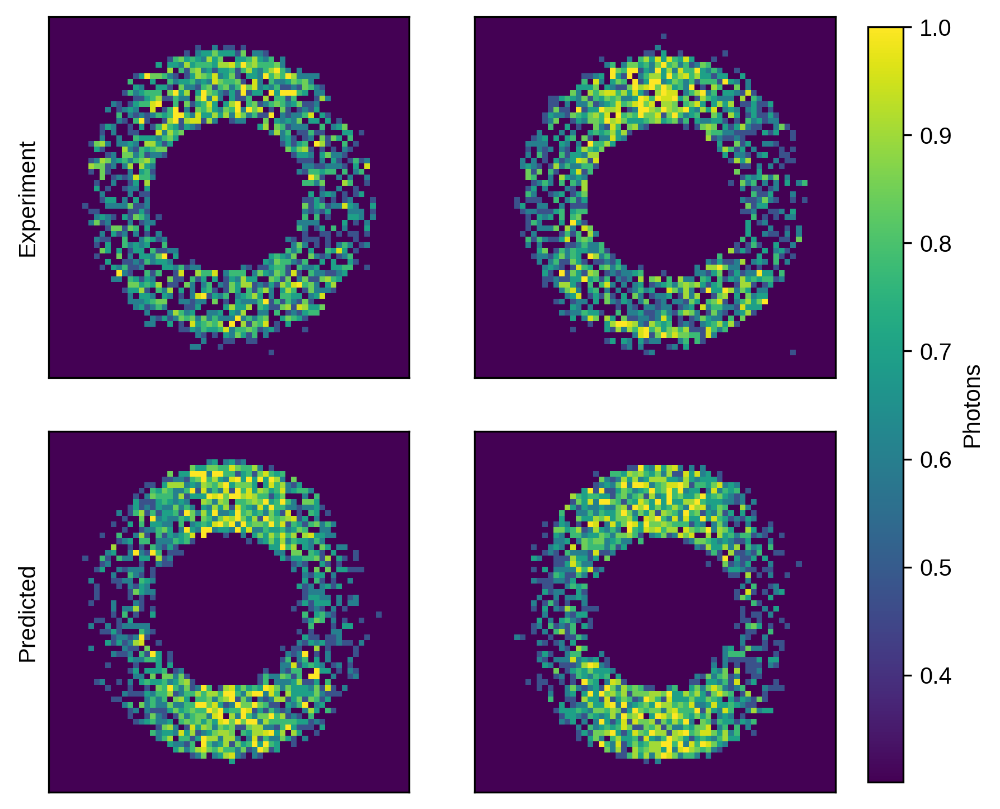

In [68]:
# Refer to Fig. 2b

vmin = 2
vmax = 10
normalizer = colors.LogNorm(vmin, vmax)
im = cm.ScalarMappable(norm=normalizer)

f, ax = plt.subplots(figsize=(7, 6), nrows=2, ncols=2, dpi=300)

ax[0, 0].imshow(plot_images[0], interpolation='none', norm=normalizer, cmap=cmc.lajolla)
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])
ax[0, 0].set_ylabel('Experiment')

ax[0, 1].imshow(plot_images[1], interpolation='none', norm=normalizer, cmap=cmc.lajolla)
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

ax[1, 0].imshow(sim_pred[0], interpolation='none', norm=normalizer, cmap=cmc.lajolla)
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])
ax[1, 0].set_ylabel('Predicted')

ax[1, 1].imshow(sim_pred[1], interpolation='none', norm=normalizer, cmap=cmc.lajolla)
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

f.subplots_adjust(hspace=0.15, wspace=0, right=0.85)
cbar_ax = f.add_axes([0.85, 0.12, 0.03, 0.75])
f.colorbar(im, cax=cbar_ax, label='Photons')